In [44]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import numpy as np
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX
from itertools import product
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
from statsmodels.tsa.arima.model import ARIMA
import itertools
from prophet import Prophet
from statsmodels.tsa.holtwinters import ExponentialSmoothing

In [45]:
# Fill categorical missing values with 'Unknown'
df = pd.read_csv('cleaned_data_dropped.csv',low_memory=False)
categorical_cols = df.select_dtypes(include=['object']).columns
print(categorical_cols)

Index(['FACILITY NAME', 'ST', 'INDUSTRY SECTOR', 'CHEMICAL',
       'CLEAN AIR ACT CHEMICAL', 'CLASSIFICATION', 'METAL', 'METAL CATEGORY',
       'CARCINOGEN', 'PBT', 'PFAS', 'UNIT OF MEASURE'],
      dtype='object')


In [46]:
df.columns

Index(['YEAR', 'FACILITY NAME', 'ST', 'INDUSTRY SECTOR CODE',
       'INDUSTRY SECTOR', 'CHEMICAL', 'CLEAN AIR ACT CHEMICAL',
       'CLASSIFICATION', 'METAL', 'METAL CATEGORY', 'CARCINOGEN', 'PBT',
       'PFAS', 'UNIT OF MEASURE', 'FUGITIVE AIR', 'STACK AIR', 'WATER',
       'UNDERGROUND', 'LANDFILLS', 'LAND TREATMENT', 'SURFACE IMPNDMNT',
       'OTHER DISPOSAL', 'ON-SITE RELEASE TOTAL', 'POTW - TRNS RLSE',
       'POTW - TRNS TRT', 'POTW - TOTAL TRANSFERS', 'OFF-SITE RELEASE TOTAL',
       'OFF-SITE RECYCLED TOTAL', 'OFF-SITE ENERGY RECOVERY T',
       'OFF-SITE TREATED TOTAL', 'UNCLASSIFIED', 'TOTAL TRANSFER',
       'TOTAL RELEASES', 'RELEASES', 'ON-SITE CONTAINED', 'ON-SITE OTHER',
       'OFF-SITE CONTAIN', 'OFF-SITE OTHER RELEASES', 'ENERGY RECOVER ON',
       'ENERGY RECOVER OF', 'RECYCLING ON SITE', 'RECYCLING OFF SIT',
       'TREATMENT ON SITE', 'TREATMENT OFF SITE', 'PRODUCTION WASTE',
       'PRODUCTION RATIO'],
      dtype='object')

In [47]:
# Aggregate by year (if not already aggregated)
time_series_data = df.groupby('YEAR')['OFF-SITE RELEASE TOTAL'].sum().reset_index()

# Ensure the YEAR column is a datetime type
time_series_data['YEAR'] = pd.to_datetime(time_series_data['YEAR'], format='%Y')
# Step 1: Check stationarity and transform if needed
time_series_data['OFF-SITE RELEASE TOTAL_diff'] = time_series_data['OFF-SITE RELEASE TOTAL'].diff().dropna()
# ADF test for stationarity
adf_test = adfuller(time_series_data['OFF-SITE RELEASE TOTAL'].dropna())
print("ADF Statistic before diff:", adf_test[0])
print("p-value before diff:", adf_test[1])

# ADF test for stationarity
adf_test = adfuller(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna())
print("ADF Statistic:", adf_test[0])
print("p-value:", adf_test[1])
outliers_detect = time_series_data.copy()
# Set YEAR as the index for time-series analysis
time_series_data.set_index('YEAR', inplace=True)

# Display the data
print(time_series_data.head())
print(time_series_data.columns)
print(outliers_detect.columns)

ADF Statistic before diff: -0.3092268317561106
p-value before diff: 0.9241873327553299
ADF Statistic: -2.6914185867908036
p-value: 0.07553503661219142
            OFF-SITE RELEASE TOTAL  OFF-SITE RELEASE TOTAL_diff
YEAR                                                           
2003-01-01            5.930665e+08                          NaN
2004-01-01            5.978628e+08                 4.796295e+06
2005-01-01            6.242363e+08                 2.637354e+07
2006-01-01            6.541451e+08                 2.990881e+07
2007-01-01            6.704232e+08                 1.627805e+07
Index(['OFF-SITE RELEASE TOTAL', 'OFF-SITE RELEASE TOTAL_diff'], dtype='object')
Index(['YEAR', 'OFF-SITE RELEASE TOTAL', 'OFF-SITE RELEASE TOTAL_diff'], dtype='object')


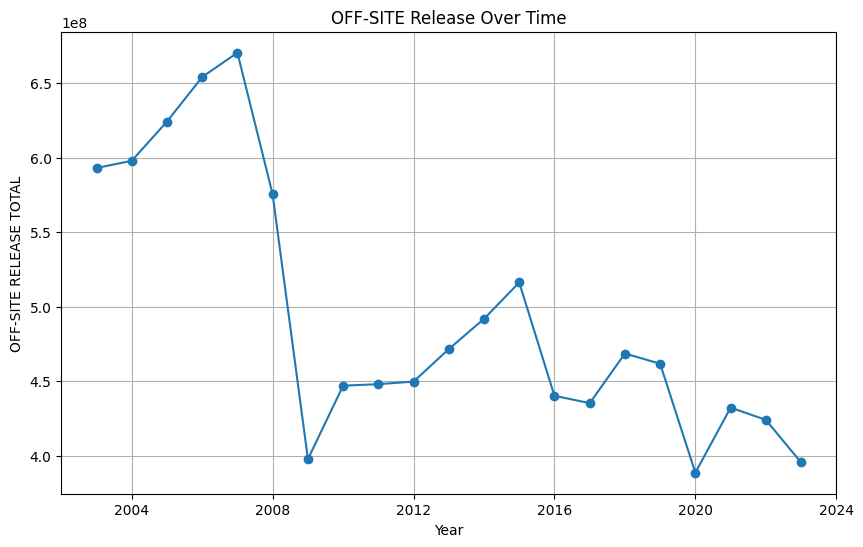

In [48]:
# Plot the time series
plt.figure(figsize=(10, 6))
plt.plot(time_series_data.index, time_series_data['OFF-SITE RELEASE TOTAL'], marker='o')
plt.title('OFF-SITE Release Over Time')
plt.xlabel('Year')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.grid()
plt.show()


In [49]:
# Calculate IQR
Q1 = time_series_data['OFF-SITE RELEASE TOTAL'].quantile(0.25)
Q3 = time_series_data['OFF-SITE RELEASE TOTAL'].quantile(0.75)
IQR = Q3 - Q1

# Identify outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
outliers = time_series_data[(time_series_data['OFF-SITE RELEASE TOTAL'] < lower_bound) | 
                            (time_series_data['OFF-SITE RELEASE TOTAL'] > upper_bound)]
print("Q1", Q1)
print("Q3", Q3)
print("IQR", IQR)
print(time_series_data['OFF-SITE RELEASE TOTAL'])
print("Outliers based on IQR:")
print(outliers)


Q1 435235656.506373
Q3 575392132.7323743
IQR 140156476.22600132
YEAR
2003-01-01    5.930665e+08
2004-01-01    5.978628e+08
2005-01-01    6.242363e+08
2006-01-01    6.541451e+08
2007-01-01    6.704232e+08
2008-01-01    5.753921e+08
2009-01-01    3.976387e+08
2010-01-01    4.469527e+08
2011-01-01    4.479715e+08
2012-01-01    4.496872e+08
2013-01-01    4.715263e+08
2014-01-01    4.918198e+08
2015-01-01    5.162329e+08
2016-01-01    4.401642e+08
2017-01-01    4.352357e+08
2018-01-01    4.685398e+08
2019-01-01    4.616760e+08
2020-01-01    3.885307e+08
2021-01-01    4.322256e+08
2022-01-01    4.240038e+08
2023-01-01    3.954452e+08
Name: OFF-SITE RELEASE TOTAL, dtype: float64
Outliers based on IQR:
Empty DataFrame
Columns: [OFF-SITE RELEASE TOTAL, OFF-SITE RELEASE TOTAL_diff]
Index: []


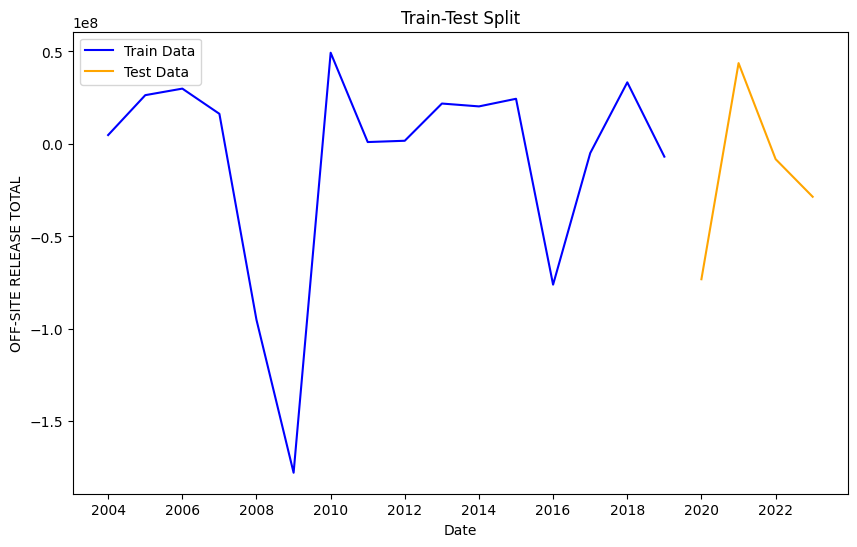

In [50]:
# Define split ratio (e.g., 80% train, 20% test)
split_ratio = 0.8
split_index = int(len(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna()) * split_ratio)

# Split into train and test
train_data = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna()[:split_index]
test_data = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna()[split_index:]

# Define test_start and test_end
test_start = test_data.index[0]
test_end = test_data.index[-1]
# Extract actual values from the time series data for the test period
actual_values = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna()[test_start:test_end]

plt.figure(figsize=(10, 6))
plt.plot(train_data, label='Train Data', color='blue')
plt.plot(test_data, label='Test Data', color='orange')
plt.xlabel('Date')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.title('Train-Test Split')
plt.legend()
plt.show()


In [51]:

warnings.filterwarnings('ignore')

# Define parameter grid for SARIMA
p = d = q = range(0, 3)  # Non-seasonal params
P = D = Q = range(0, 2)  # Seasonal params
s = [12]  # Seasonal period (yearly data)

# Create all combinations
param_grid = list(product(p, d, q, P, D, Q, s))

# Track best parameters
best_rmse = float("inf")
best_params = None

# Grid search
for params in param_grid:
    try:
        sarima_model = SARIMAX(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(),
                               order=(params[0], params[1], params[2]),
                               seasonal_order=(params[3], params[4], params[5], params[6]),
                               enforce_stationarity=False,
                               enforce_invertibility=False)
        results = sarima_model.fit(disp=False)
        # Predict and evaluate
        predictions = results.predict(start=test_start, end=test_end)
        rmse = mean_squared_error(actual_values, predictions, squared=False)
        if rmse < best_rmse:
            best_rmse = rmse
            best_params = params
    except Exception as e:
        print("Error Occured")
        continue

p, d, q, P, D, Q, s = best_params
print(f'Best SARIMA Parameters: {best_params}')
print(f'Best RMSE: {best_rmse}')
print(p, d, q, P, D, Q, s)


Best SARIMA Parameters: (2, 0, 2, 1, 0, 1, 12)
Best RMSE: 2236.0549899102944
2 0 2 1 0 1 12


In [52]:
# Refit the model using the best parameters
best_model = SARIMAX(
    time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(), 
    order=(p, d, q),        # (p, d, q)
    seasonal_order=(P, D, Q, s),  # (P, D, Q, s)
    enforce_stationarity=False, 
    enforce_invertibility=False
)

best_model_fitted = best_model.fit(disp=False)
print(best_model_fitted.summary())

# Predict on the test set
predicted_values = best_model_fitted.predict(start=test_start, end=test_end)

# Calculate RMSE for the test set
from sklearn.metrics import mean_squared_error
import numpy as np

rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
print(f"Test RMSE: {rmse}")
print(actual_values)
print(predicted_values)



                                      SARIMAX Results                                       
Dep. Variable:          OFF-SITE RELEASE TOTAL_diff   No. Observations:                   20
Model:             SARIMAX(2, 0, 2)x(1, 0, [1], 12)   Log Likelihood                 -91.141
Date:                              Tue, 19 Nov 2024   AIC                            196.281
Time:                                      19:53:48   BIC                            193.547
Sample:                                  01-01-2004   HQIC                           188.944
                                       - 01-01-2023                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.8857    2.2e+04  -4.03e-05      1.000   -4.31e+04    4.31e+04
ar.L2         -0.65

2024-01-01    3.421911e+07
2025-01-01   -9.198137e+06
2026-01-01   -1.007078e+07
2027-01-01    2.069996e+07
2028-01-01   -1.595585e+07
Name: predicted_mean, dtype: float64
                 YEAR      FORECAST
2024-01-01 2024-12-31  3.421911e+07
2025-01-01 2025-12-31 -9.198137e+06
2026-01-01 2026-12-31 -1.007078e+07
2027-01-01 2027-12-31  2.069996e+07
2028-01-01 2028-12-31 -1.595585e+07


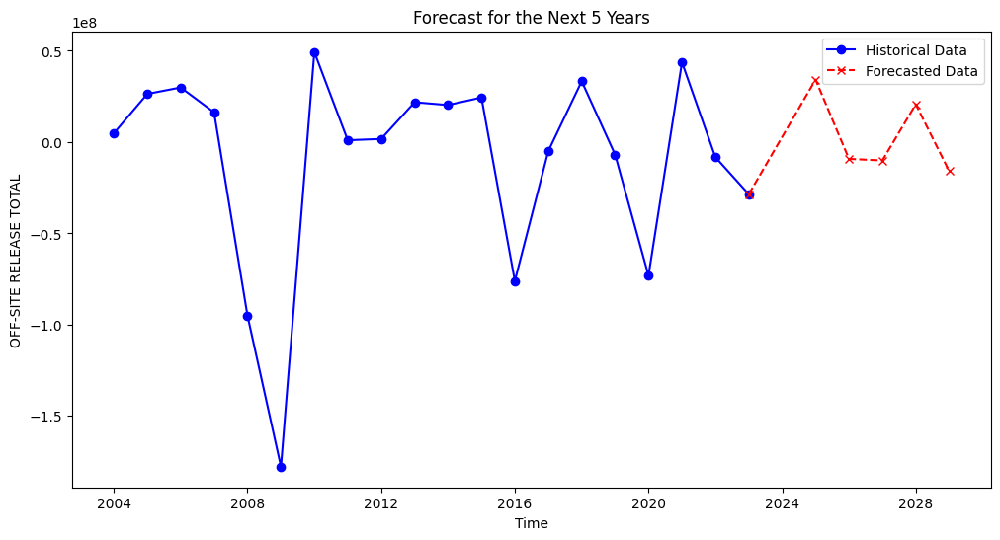

In [53]:
# Forecast for the next 5 years (60 months)
forecast_steps = 5 * 12  # 5 years
forecast = best_model_fitted.forecast(steps=forecast_steps)

# Create a date range for the forecast
forecast_index = pd.date_range(start='2024-01-01', periods=forecast_steps, freq='MS')
forecast_series = pd.Series(forecast, index=forecast_index)
forecast_series = forecast_series.dropna()
# Print the forecasted values
print(forecast_series)
historical_df = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_series})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')
# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')
plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()


In [54]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['OFF-SITE RELEASE TOTAL'].iloc[-1]
forecast_original_scale = forecast_series.cumsum() + last_value  
forecast_original_scale

2024-01-01    4.296644e+08
2025-01-01    4.204662e+08
2026-01-01    4.103954e+08
2027-01-01    4.310954e+08
2028-01-01    4.151396e+08
Name: predicted_mean, dtype: float64

                 YEAR      FORECAST
2024-01-01 2024-12-31  4.296644e+08
2025-01-01 2025-12-31  4.204662e+08
2026-01-01 2026-12-31  4.103954e+08
2027-01-01 2027-12-31  4.310954e+08
2028-01-01 2028-12-31  4.151396e+08


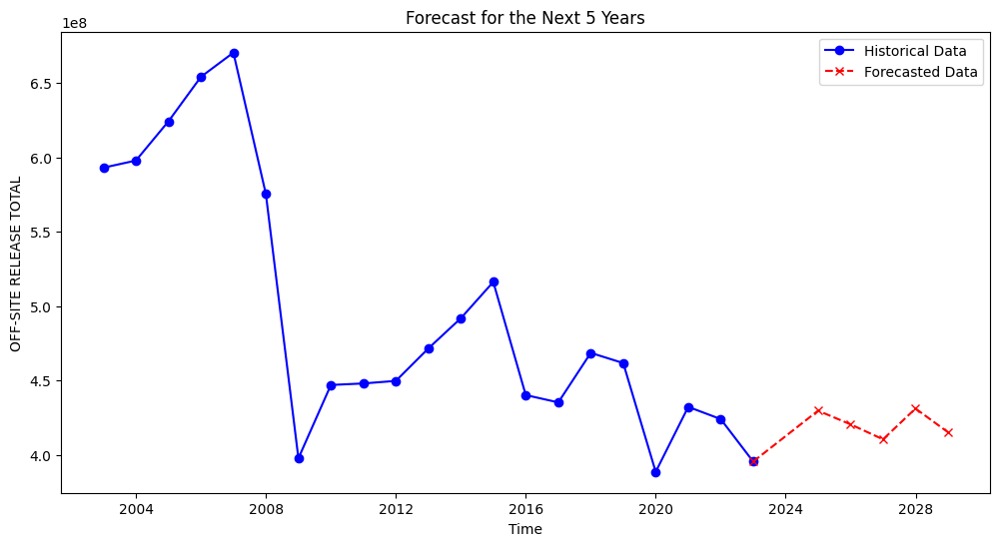

In [55]:
historical_df = time_series_data['OFF-SITE RELEASE TOTAL'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()

In [56]:

# Define the p, d, q parameter ranges
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

best_aic = float('inf')
best_pdq = None

for param in pdq:
    try:
        model = ARIMA(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(), order=param)
        model_fit = model.fit()
        if model_fit.aic < best_aic:
            best_aic = model_fit.aic
            best_pdq = param
    except:
        continue

print(f"Best ARIMA model order: {best_pdq} with AIC: {best_aic}")


Best ARIMA model order: (0, 2, 2) with AIC: 708.9740847002303


In [57]:
# Define the parameter grid for ARIMA (p, d, q)
p = d = q = range(0, 3)
pdq = list(itertools.product(p, d, q))

best_rmse = float('inf')
best_pdq = None

for param in pdq:
    try:
        model = ARIMA(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(), order=param)
        model_fit = model.fit()

        # Predict on the train set (or test set if available)
        predicted_values = model_fit.predict(start=test_start, end=test_end)

        # Calculate RMSE
        rmse = np.sqrt(mean_squared_error(actual_values, predicted_values))
        # print(rmse)
        # Update best model if RMSE is better
        if rmse < best_rmse:
            best_rmse = rmse
            best_pdq = param
    except Exception as e:
        print(f"Error with parameters {param}: {e}")
        continue

print(f"Best ARIMA model order: {best_pdq} with RMSE: {best_rmse}")


Best ARIMA model order: (1, 0, 1) with RMSE: 34475379.92487661


In [58]:
# Fit the model with the best parameters
best_model = ARIMA(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(), order=best_pdq)
best_model_fit = best_model.fit()

# Print the model summary
print(best_model_fit.summary())


                                    SARIMAX Results                                    
Dep. Variable:     OFF-SITE RELEASE TOTAL_diff   No. Observations:                   20
Model:                          ARIMA(1, 0, 1)   Log Likelihood                -383.658
Date:                         Tue, 19 Nov 2024   AIC                            775.315
Time:                                 19:53:56   BIC                            779.298
Sample:                             01-01-2004   HQIC                           776.093
                                  - 01-01-2023                                         
Covariance Type:                           opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const      -9.881e+06   8.37e+06     -1.181      0.238   -2.63e+07    6.52e+06
ar.L1          0.5946      0.555      1.072      0.284     

2024-01-01   -9.927281e+06
2025-01-01   -9.908542e+06
2026-01-01   -9.897400e+06
2027-01-01   -9.890776e+06
2028-01-01   -9.886838e+06
Freq: YS-JAN, Name: predicted_mean, dtype: float64
                 YEAR      FORECAST
2024-01-01 2024-12-31 -9.927281e+06
2025-01-01 2025-12-31 -9.908542e+06
2026-01-01 2026-12-31 -9.897400e+06
2027-01-01 2027-12-31 -9.890776e+06
2028-01-01 2028-12-31 -9.886838e+06


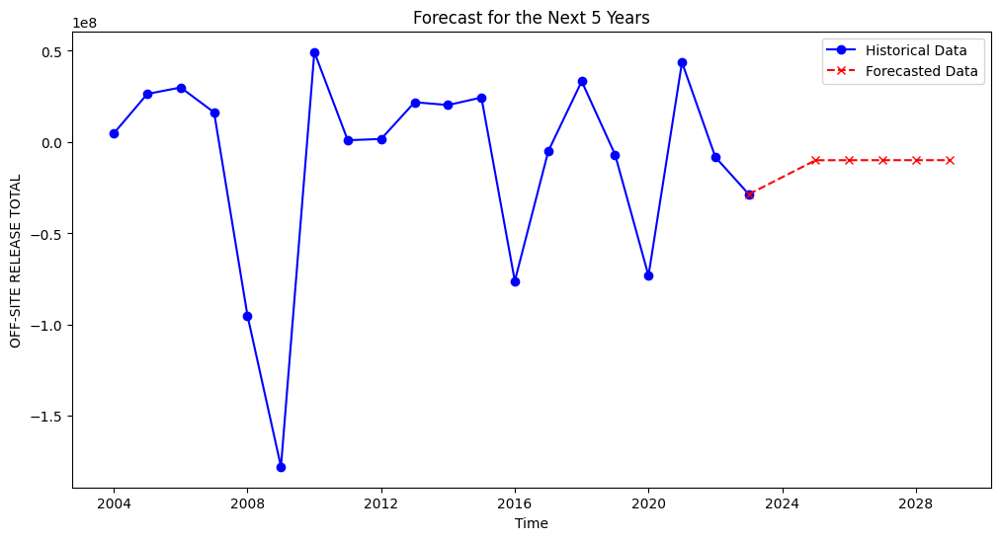

In [59]:
# Fit the ARIMA model with the best parameters (best_pdq)
model = ARIMA(time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna(), order=best_pdq)  # Use the best (p, d, q) found during tuning
model_fit = model.fit()

forecast = model_fit.forecast(steps=5)
print(forecast)

historical_df = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast})
print(forecast_df)
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))


# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()


In [60]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['OFF-SITE RELEASE TOTAL'].iloc[-1]
forecast_original_scale = forecast.cumsum() + last_value
forecast_original_scale

2024-01-01    3.855180e+08
2025-01-01    3.756094e+08
2026-01-01    3.657120e+08
2027-01-01    3.558212e+08
2028-01-01    3.459344e+08
Freq: YS-JAN, Name: predicted_mean, dtype: float64

                 YEAR      FORECAST
2024-01-01 2024-12-31  3.855180e+08
2025-01-01 2025-12-31  3.756094e+08
2026-01-01 2026-12-31  3.657120e+08
2027-01-01 2027-12-31  3.558212e+08
2028-01-01 2028-12-31  3.459344e+08


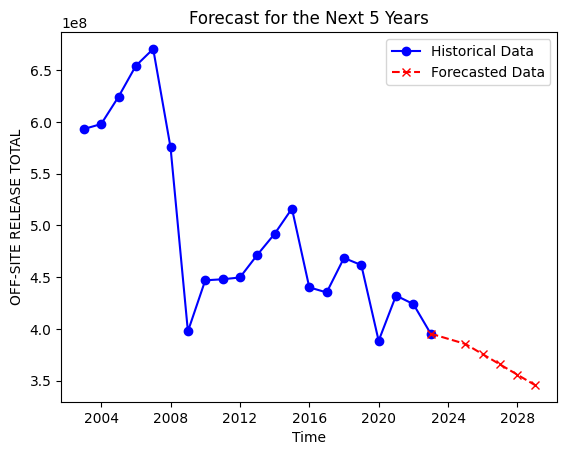

In [61]:
historical_df = time_series_data['OFF-SITE RELEASE TOTAL'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()

In [62]:
# Rename columns for Prophet
prophet_data = outliers_detect.rename(columns={'YEAR': 'ds', 'OFF-SITE RELEASE TOTAL': 'y'})
# Fit the model
model = Prophet()
model.fit(prophet_data)

# Generate predictions
forecast = model.predict(prophet_data)

# Residuals
prophet_data['residuals'] = prophet_data['y'] - forecast['yhat']

# Highlight outliers
outliers = prophet_data[prophet_data['residuals'].abs() > 3 * prophet_data['residuals'].std()]
print("Outliers detected by Prophet:")
print(outliers)
 

19:53:56 - cmdstanpy - INFO - Chain [1] start processing
19:53:56 - cmdstanpy - INFO - Chain [1] done processing


Outliers detected by Prophet:
Empty DataFrame
Columns: [ds, y, OFF-SITE RELEASE TOTAL_diff, residuals]
Index: []


In [63]:
# Hyperparameter tuning for Prophet
best_rmse_prophet = float('inf')
best_prophet_params = None

# Hyperparameters for Prophet
changepoint_scales = [0.01, 0.1, 0.5]
seasonality_modes = ['additive', 'multiplicative']

# Assuming you have your time_series_data with 'OFF-SITE RELEASE TOTAL'
# and you are working with the original time series (not differenced)
df_prophet = time_series_data[['OFF-SITE RELEASE TOTAL_diff']].reset_index()
df_prophet.columns = ['ds', 'y']
# print(df_prophet[:-5])

for changepoint in changepoint_scales:
    for seasonality in seasonality_modes:
        try:
            # Create and fit the Prophet model
            model = Prophet(yearly_seasonality=True,changepoint_prior_scale=changepoint, seasonality_mode=seasonality)
            model.fit(df_prophet[:-5])

            # Forecast for the next 5 years (60 months)
            future = model.make_future_dataframe(periods=6, freq='Y',include_history=False)  # Forecasting for the next 5 years
            forecast = model.predict(future)
            # print(forecast_values)
            # Forecasted values
            forecast_values = forecast['yhat'][1:].values  # For the next 60 months
            print(forecast_values)

            # Compare with actual values (if available, for RMSE calculation)
            # You would compare these forecasted values with your test set if available
            # If no actual future values exist, this step can be skipped
            # Example assuming actual values for comparison (otherwise, remove this part):
            actual_values = time_series_data['OFF-SITE RELEASE TOTAL_diff'][-5:]  # Adjust this as needed
            # print("--------------",(actual_values, forecast_values))
            rmse = np.sqrt(mean_squared_error(actual_values, forecast_values))
            # print("--------------")

            # Update best RMSE and parameters
            if rmse < best_rmse_prophet:
                best_rmse_prophet = rmse
                best_prophet_params = (changepoint, seasonality)

        except Exception as e:
            print(f"Error with Prophet params (changepoint={changepoint}, seasonality={seasonality}): {e}")
            continue

print(f"Best Prophet model with RMSE: {best_rmse_prophet} and parameters: {best_prophet_params}")


19:53:57 - cmdstanpy - INFO - Chain [1] start processing
19:53:57 - cmdstanpy - INFO - Chain [1] done processing
19:53:57 - cmdstanpy - INFO - Chain [1] start processing
19:53:57 - cmdstanpy - INFO - Chain [1] done processing


[-38968454.23731452 -15531242.71202334 -21770952.96254615
 -28771546.83315118 -36522065.27176451]
[-1235168.28961776  -545862.55460554   127737.87539388   806899.52673407
  1490661.07142154]


19:53:57 - cmdstanpy - INFO - Chain [1] start processing
19:53:57 - cmdstanpy - INFO - Chain [1] done processing
19:53:57 - cmdstanpy - INFO - Chain [1] start processing
19:53:57 - cmdstanpy - INFO - Chain [1] done processing


[-38989164.44343111 -15548475.41328808 -21789898.18683554
 -28792227.30042067 -36544502.05783664]


19:53:57 - cmdstanpy - INFO - Chain [1] start processing
19:53:58 - cmdstanpy - INFO - Chain [1] done processing


[-1465976.9806742   -702672.42513665    41433.3643427    791814.25009884
  1547400.27370482]


19:53:58 - cmdstanpy - INFO - Chain [1] start processing


[-39000396.21297359 -15556920.71815218 -21799205.04645351
 -28802436.90673428 -36555654.38524379]


19:53:58 - cmdstanpy - INFO - Chain [1] done processing


[24861124.44702009 33725918.38484804 42255142.97333501 50710897.24654977
 59075445.00987566]
Best Prophet model with RMSE: 40423578.9189255 and parameters: (0.1, 'multiplicative')


19:53:58 - cmdstanpy - INFO - Chain [1] start processing
19:53:58 - cmdstanpy - INFO - Chain [1] done processing


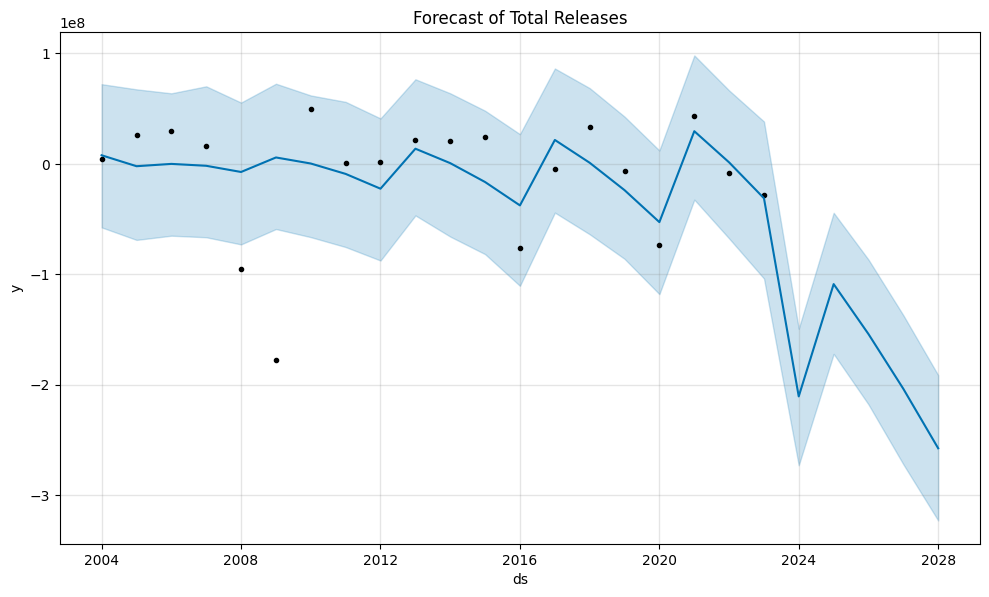

,ds,yhat,yhat_lower,yhat_upper
20,2023-12-31,-2.105242e+08,-2.728874e+08,-1.491835e+08
21,2024-12-31,-1.088403e+08,-1.720232e+08,-4.427002e+07
22,2025-12-31,-1.541069e+08,-2.178000e+08,-8.667144e+07
23,2026-12-31,-2.036570e+08,-2.720039e+08,-1.370100e+08
24,2027-12-31,-2.574823e+08,-3.228547e+08,-1.912548e+08


In [64]:
time_series_prophet_data = time_series_data['OFF-SITE RELEASE TOTAL_diff'].dropna().copy()
# Prepare data for Prophet
prophet_data = time_series_prophet_data.reset_index()
prophet_data.columns = ['ds', 'y']  # Prophet requires 'ds' for date and 'y' for the target

# Initialize and fit the Prophet model
model = Prophet(changepoint_prior_scale=best_prophet_params[0], seasonality_mode=best_prophet_params[1],yearly_seasonality=True)
model.fit(prophet_data)

# Create a DataFrame for future years
future = model.make_future_dataframe(periods=5, freq='Y')  # Forecasting for the next 5 years
forecast = model.predict(future)

# Plot the forecast
model.plot(forecast)
plt.title('Forecast of Total Releases')
plt.show()

# Display forecasted values
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(5)


In [65]:
# Assuming 'time_series_data' has 'OFF-SITE RELEASE TOTAL' column with yearly data
df_hw = time_series_data[['OFF-SITE RELEASE TOTAL']][:-5]
trend_options = ['add', 'mul']
# Try fitting with no seasonality and additive seasonality
best_rmse_hw = float('inf')
best_hw_params = None

for trend in trend_options:
    for seasonal in [None, 'mul','add']:  # 'None' means no seasonality, 'add' means additive seasonality
        try:
            # Fit the Holt-Winters Exponential Smoothing model
            if seasonal:
                model = ExponentialSmoothing(df_hw, trend=trend, seasonal=seasonal,seasonal_periods=1)  # Yearly data, seasonal periods=1
            else:
                model = ExponentialSmoothing(df_hw, trend=trend, seasonal=None)  # No seasonality
            
            model_fit = model.fit()

            # Forecast for the next 5 years (5 values)
            forecast_steps = 5  # Forecasting 5 years ahead
            forecast_values = model_fit.forecast(forecast_steps)
            # print(forecast_values)
            # If actual future values are available, calculate RMSE
            # Assuming actual values exist in the future for comparison
            actual_values = time_series_data['OFF-SITE RELEASE TOTAL'].values[-5:]  # Adjust this if you have real data
            rmse = np.sqrt(mean_squared_error(actual_values, forecast_values))

            # Update best RMSE and parameters
            if rmse < best_rmse_hw:
                best_rmse_hw = rmse
                best_hw_params = (trend, seasonal)

        except Exception as e:
            print(f"Error with Exponential Smoothing params (seasonal={seasonal}): {e}")
            continue

print(f"Best Holt-Winters model with RMSE: {best_rmse_hw} and parameters: {best_hw_params}")


Error with Exponential Smoothing params (seasonal=mul): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=add): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=mul): seasonal_periods must be larger than 1.
Error with Exponential Smoothing params (seasonal=add): seasonal_periods must be larger than 1.
Best Holt-Winters model with RMSE: 23973282.43991283 and parameters: ('mul', None)


In [66]:
# Fit Holt-Winters model (using additive trend and seasonality)
model = ExponentialSmoothing(time_series_data['OFF-SITE RELEASE TOTAL'], trend=best_hw_params[0], seasonal=best_hw_params[1]).fit()

# Forecast the next 12 periods (e.g., months)
forecast = model.forecast(steps=5)
print(forecast)

2024-01-01    3.811492e+08
2025-01-01    3.673090e+08
2026-01-01    3.539714e+08
2027-01-01    3.411181e+08
2028-01-01    3.287315e+08
Freq: YS-JAN, dtype: float64


                 YEAR      FORECAST
2024-01-01 2024-12-31  3.811492e+08
2025-01-01 2025-12-31  3.673090e+08
2026-01-01 2026-12-31  3.539714e+08
2027-01-01 2027-12-31  3.411181e+08
2028-01-01 2028-12-31  3.287315e+08


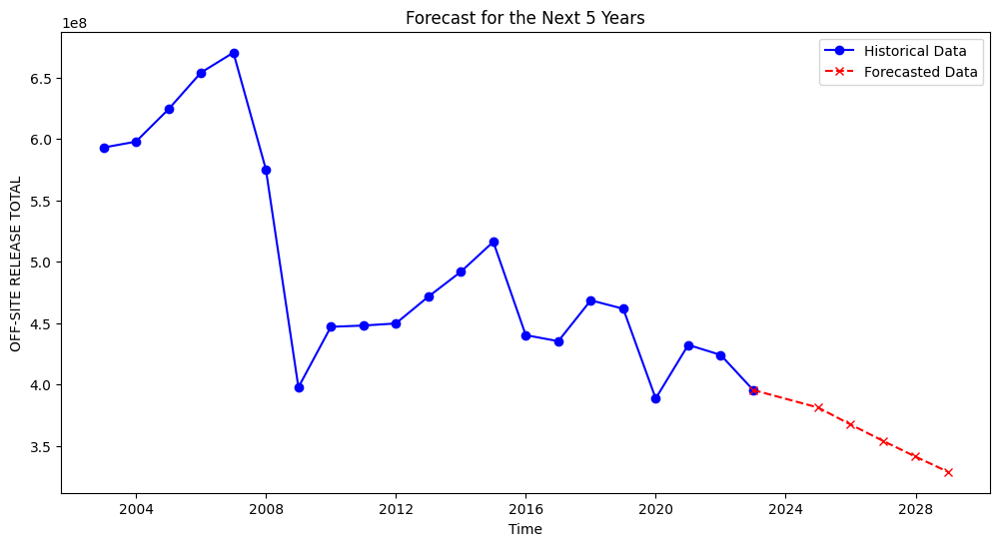

In [67]:
historical_df = time_series_data['OFF-SITE RELEASE TOTAL'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast})
print(forecast_df)
plt.figure(figsize=(12, 6))

# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()

In [68]:
pip install xgboost

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


In [69]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error

# Prepare lagged features
def create_lag_features(data, lag=1):
    df = pd.DataFrame(data)
    for i in range(1, lag + 1):
        df[f'lag_{i}'] = df[0].shift(i)
    df = df.dropna()
    return df

# Lag settings
lag = 3  # Use the last 3 values to predict the next one
data_lagged = create_lag_features(time_series_data['OFF-SITE RELEASE TOTAL_diff'].values, lag)
X = data_lagged.iloc[:, 1:].values
y = data_lagged.iloc[:, 0].values

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
print(X_test)
print(y_test)
# Hyperparameter tuning for XGBoost
best_rmse_xgb = float('inf')
best_xgb_params = None

# Hyperparameter grid
learning_rates = [0.01, 0.1, 0.2]
max_depths = [3, 5, 7, 9, 11, 13, 15]
n_estimators = [50, 100, 200, 400]

for lr in learning_rates:
    for depth in max_depths:
        for n in n_estimators:
            try:
                # Train XGBoost model
                model = XGBRegressor(learning_rate=lr, max_depth=depth, n_estimators=n, objective='reg:squarederror')
                model.fit(X_train, y_train)

                # Predict on test set
                y_pred = model.predict(X_test)
                rmse = np.sqrt(mean_squared_error(y_test, y_pred))

                # Update best RMSE and parameters
                if rmse < best_rmse_xgb:
                    best_rmse_xgb = rmse
                    best_xgb_params = (lr, depth, n)

            except Exception as e:
                print(f"Error with XGBoost params (lr={lr}, depth={depth}, n_estimators={n}): {e}")
                continue

print(f"Best XGBoost model with RMSE: {best_rmse_xgb} and parameters: {best_xgb_params}")



[[ 2.99088130e+07  2.63735390e+07  4.79629481e+06]
 [ 1.62780453e+07  2.99088130e+07  2.63735390e+07]
 [ 1.01882157e+06  4.93139358e+07 -1.77753394e+08]
 [ 4.36949840e+07 -7.31453781e+07 -6.86381325e+06]]
[ 16278045.28953528 -95031050.40821385   1715734.71496075
  -8221851.58388752]
Best XGBoost model with RMSE: 47397700.38303573 and parameters: (0.01, 3, 50)


In [70]:

# Forecast future values
last_lag = time_series_data['OFF-SITE RELEASE TOTAL_diff'].values[-lag:]  # Last 'lag' values
model = XGBRegressor(learning_rate=best_xgb_params[0], max_depth=best_xgb_params[1], n_estimators=best_xgb_params[2], objective='reg:squarederror')
model.fit(X_train, y_train)
# print(last_lag)
future_forecasts = []
for _ in range(5):  # Forecast 5 future values
    input_data = last_lag[-lag:].reshape(1, -1)
    # print(input_data)
    prediction = model.predict(input_data)[0]
    future_forecasts.append(prediction)
    last_lag = np.append(last_lag, prediction)

print("Forecasted values for next 5 years:", future_forecasts)

Forecasted values for next 5 years: [np.float32(-10379781.0), np.float32(2738647.8), np.float32(2738647.8), np.float32(2738647.8), np.float32(2738647.8)]


In [71]:
# Inverse the differencing to return to the original scale
last_value = time_series_data['OFF-SITE RELEASE TOTAL'].iloc[-1]
forecast_original_scale = np.array(future_forecasts).cumsum() + last_value  
forecast_original_scale

array([3.85065466e+08, 3.87804114e+08, 3.90542762e+08, 3.93281410e+08,
       3.96020058e+08])

        YEAR      FORECAST
0 2024-12-31  3.850655e+08
1 2025-12-31  3.878041e+08
2 2026-12-31  3.905428e+08
3 2027-12-31  3.932814e+08
4 2028-12-31  3.960201e+08


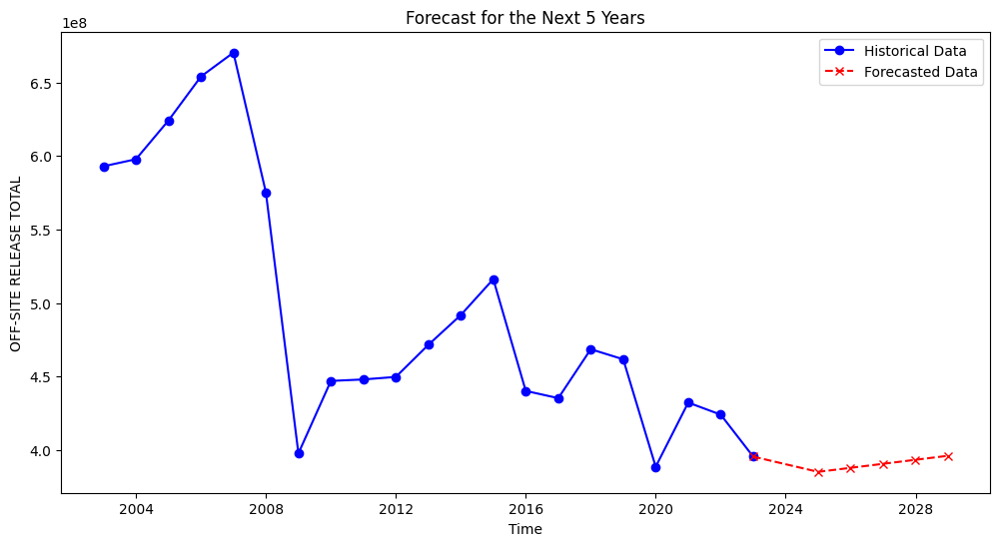

In [72]:
historical_df = time_series_data['OFF-SITE RELEASE TOTAL'].dropna().reset_index()
historical_df.columns = ['YEAR', 'ACTUAL']
# Display forecasted values
future_years = pd.date_range(start=time_series_data['OFF-SITE RELEASE TOTAL'].dropna().index[-1] + pd.DateOffset(years=1), periods=5, freq='Y')
forecast_df = pd.DataFrame({'YEAR': future_years, 'FORECAST': forecast_original_scale})
print(forecast_df)

plt.figure(figsize=(12, 6))
# Plot historical data
plt.plot(historical_df['YEAR'], historical_df['ACTUAL'], label='Historical Data', marker='o', color='blue')

# Plot forecasted data
plt.plot([historical_df['YEAR'].iloc[-1]] + forecast_df['YEAR'].tolist(), 
         [historical_df['ACTUAL'].iloc[-1]] + forecast_df['FORECAST'].tolist(), 
         label='Forecasted Data', marker='x', linestyle='--', color='red')

plt.title('Forecast for the Next 5 Years')
plt.xlabel('Time')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.show()

In [73]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0]
}

grid_search = GridSearchCV(
    estimator=XGBRegressor(objective="reg:squarederror"),
    param_grid=param_grid,
    scoring='neg_mean_squared_error',
    cv=3,
    verbose=1
)

grid_search.fit(X_train, y_train)
print("Best Parameters:", grid_search.best_params_)


Fitting 3 folds for each of 108 candidates, totalling 324 fits
Best Parameters: {'colsample_bytree': 0.8, 'learning_rate': 0.01, 'max_depth': 7, 'n_estimators': 50, 'subsample': 0.8}


In [74]:
time_series_data['OFF-SITE RELEASE TOTAL']

YEAR
2003-01-01    5.930665e+08
2004-01-01    5.978628e+08
2005-01-01    6.242363e+08
2006-01-01    6.541451e+08
2007-01-01    6.704232e+08
2008-01-01    5.753921e+08
2009-01-01    3.976387e+08
2010-01-01    4.469527e+08
2011-01-01    4.479715e+08
2012-01-01    4.496872e+08
2013-01-01    4.715263e+08
2014-01-01    4.918198e+08
2015-01-01    5.162329e+08
2016-01-01    4.401642e+08
2017-01-01    4.352357e+08
2018-01-01    4.685398e+08
2019-01-01    4.616760e+08
2020-01-01    3.885307e+08
2021-01-01    4.322256e+08
2022-01-01    4.240038e+08
2023-01-01    3.954452e+08
Name: OFF-SITE RELEASE TOTAL, dtype: float64

In [75]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error

# ... (data preparation and feature engineering steps)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

param_grid = {
    'num_leaves': [31, 63, 127],
    'learning_rate': [0.01, 0.05, 0.1],
    'max_depth': [-1, 5, 10],
    'min_child_samples': [20, 50, 100],
    'subsample': [0.8, 0.9, 1.0]
}

grid_search = GridSearchCV(lgb.LGBMRegressor(), param_grid, cv=5, scoring='neg_mean_squared_error')
grid_search.fit(X_train, y_train)

best_model = grid_search.best_estimator_

y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error:", mse)

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 10, number of used features: 0
[LightGBM] [Info] Start training from score 6403729.981250
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet th

In [76]:
# Prepare the data (ensure 'ds' column is for dates and 'y' is for target values)
data_time_series_prophet_data = time_series_prophet_data.reset_index().rename(columns={'YEAR': 'ds', 'OFF-SITE RELEASE TOTAL': 'y'})

# Split the data into training and testing sets (80% train, 20% test)
train_size = int(len(data_time_series_prophet_data) * 0.8)
train_data = data_time_series_prophet_data.iloc[:train_size]
test_data = data_time_series_prophet_data.iloc[train_size:]

# Fit the Prophet model on the training set
model = Prophet()
model.fit(train_data)

# Make predictions on the test set
future = model.make_future_dataframe(periods=len(test_data), freq='Y')
forecast = model.predict(future)

# Extract the predictions corresponding to the test set
forecast_test = forecast.iloc[-len(test_data):]

# Calculate evaluation metrics
mae = mean_absolute_error(test_data['y'], forecast_test['yhat'])
rmse = np.sqrt(mean_squared_error(test_data['y'], forecast_test['yhat']))
mape = np.mean(np.abs((test_data['y'] - forecast_test['yhat']) / test_data['y'])) * 100

# Print the evaluation results
print(f"MAE: {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"MAPE: {mape:.2f}%")

# Plot the results
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(data_time_series_prophet_data['ds'], data_time_series_prophet_data['y'], label='Actual Data', color='blue', marker='o')
plt.plot(forecast['ds'], forecast['yhat'], label='Predicted Data', color='red', linestyle='--')
plt.axvline(data_time_series_prophet_data['ds'].iloc[train_size], color='black', linestyle='--', label='Train-Test Split')
plt.title('Prophet Model - Actual vs Predicted')
plt.xlabel('Year')
plt.ylabel('OFF-SITE RELEASE TOTAL')
plt.legend()
plt.grid()
plt.show()


ValueError: Dataframe must have columns "ds" and "y" with the dates and values respectively.

KeyError: 'ds'

<Figure size 1200x600 with 0 Axes>

In [ ]:
# Add historical data to the comparison DataFrame
historical_df = train.reset_index().rename(columns={'OFF-SITE RELEASE TOTAL': 'Actual'})
comparison_df = pd.concat([historical_df, comparison_df]).sort_values(by='Year')


In [ ]:

for col in categorical_cols:
    df[col].fillna('Unknown', inplace=True)

# Fill numeric missing values with the column mean
numeric_cols = df.select_dtypes(include=[np.number]).columns
for col in numeric_cols:
    df[col].fillna(df[col].mean(), inplace=True)


C:\Users\psath\AppData\Local\Temp\ipykernel_7220\1270653409.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df[col].fillna('Unknown', inplace=True)
C:\Users\psath\AppData\Local\Temp\ipykernel_7220\1270653409.py:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when 

In [ ]:
df = pd.get_dummies(df, columns=categorical_cols, drop_first=True)
# df.to_csv('cleaned_data_for_models.csv', index=False)


In [ ]:
X = df.drop(columns=['OFF-SITE RELEASE TOTAL'])
y = df['OFF-SITE RELEASE TOTAL']


In [ ]:
print(df.columns)

Index(['YEAR', 'INDUSTRY SECTOR CODE', 'FUGITIVE AIR', 'STACK AIR', 'WATER',
       'UNDERGROUND', 'LANDFILLS', 'LAND TREATMENT', 'SURFACE IMPNDMNT',
       'OTHER DISPOSAL',
       ...
       'METAL CATEGORY_Metals with qualifiers', 'METAL CATEGORY_Non_Metal',
       'METAL CATEGORY_Unknown', 'CARCINOGEN_Unknown', 'CARCINOGEN_YES',
       'PBT_Unknown', 'PBT_YES', 'PFAS_Unknown', 'PFAS_YES',
       'UNIT OF MEASURE_Unknown'],
      dtype='object', length=720)


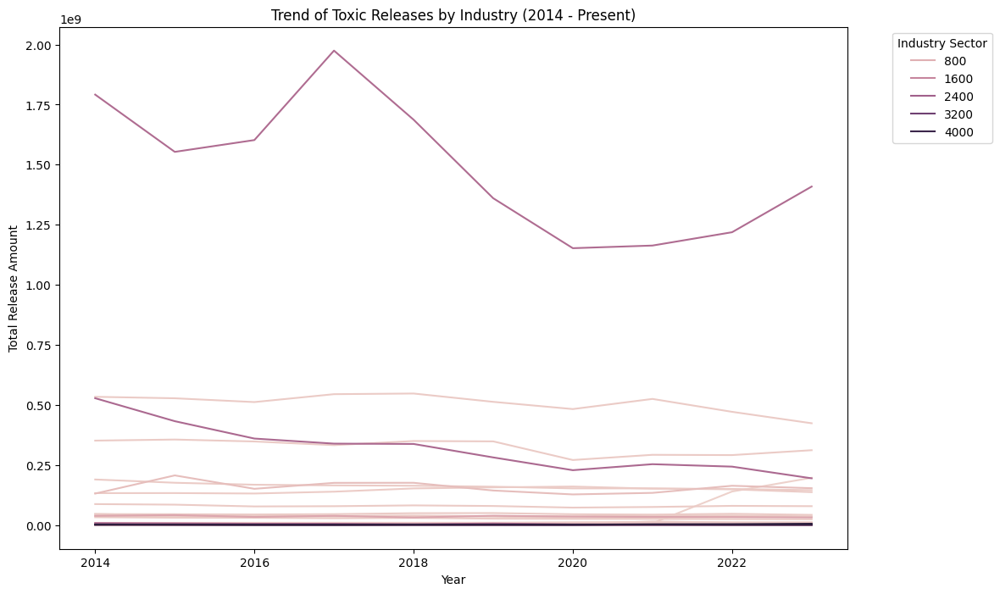

In [ ]:
industry_trends = df.groupby(['YEAR', 'INDUSTRY SECTOR CODE'])['OFF-SITE RELEASE TOTAL'].sum().reset_index()

# Plot industry trends over time
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 8))
sns.lineplot(data=industry_trends, x='YEAR', y='OFF-SITE RELEASE TOTAL', hue='INDUSTRY SECTOR CODE')
plt.title('Trend of Toxic Releases by Industry (2014 - Present)')
plt.ylabel('Total Release Amount')
plt.xlabel('Year')
plt.legend(title='Industry Sector', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

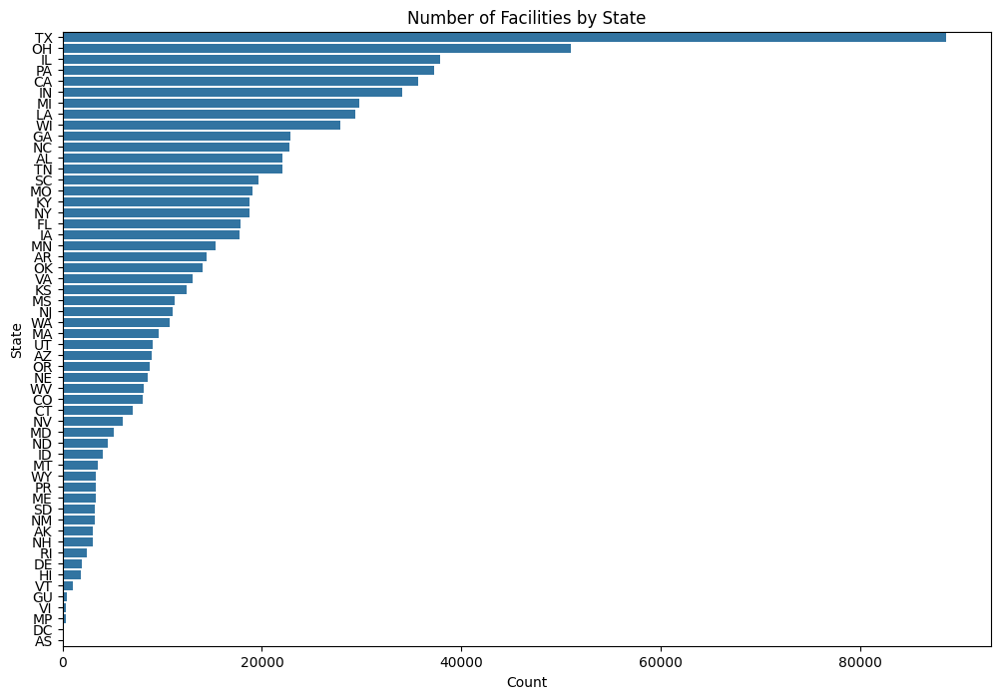

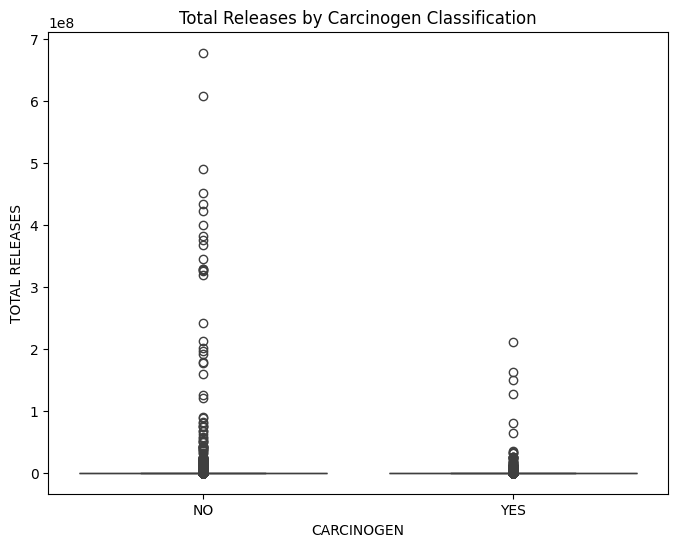

In [ ]:
# Plotting number of facilities by state
plt.figure(figsize=(12, 8))
sns.countplot(y='ST', data=data, order=data['ST'].value_counts().index)
plt.title("Number of Facilities by State")
plt.xlabel("Count")
plt.ylabel("State")
plt.show()

# Relationship between CARCINOGEN and TOTAL RELEASES
plt.figure(figsize=(8, 6))
sns.boxplot(data=data, x='CARCINOGEN', y='OFF-SITE RELEASE TOTAL')
plt.title("Total Releases by Carcinogen Classification")
plt.show()

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# scaler = StandardScaler()
# X_train = scaler.fit_transform(X_train)
# X_test = scaler.transform(X_test)


In [ ]:
# lr = LinearRegression()
# lr.fit(X_train, y_train)
# y_pred_lr = lr.predict(X_test)

# # Evaluate
# print("Linear Regression RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_lr)))
# print("Linear Regression R^2:", r2_score(y_test, y_pred_lr))


Linear Regression RMSE: 6651.617608052711
Linear Regression R^2: 0.9999899278684227


In [ ]:
# dt = DecisionTreeRegressor(random_state=42)
# dt.fit(X_train, y_train)
# y_pred_dt = dt.predict(X_test)


# # Evaluate
# print("Decision Tree RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_dt)))
# print("Decision Tree R^2:", r2_score(y_test, y_pred_dt))


Decision Tree RMSE: 174791.9096560993
Decision Tree R^2: 0.9930448020260622


In [ ]:
# rf = RandomForestRegressor(random_state=42)
# rf.fit(X_train, y_train)
# y_pred_rf = rf.predict(X_test)

# # Evaluate
# print("Random Forest RMSE:", np.sqrt(mean_squared_error(y_test, y_pred_rf)))
# print("Random Forest R^2:", r2_score(y_test, y_pred_rf))
